In [1]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 21.6 MB/s eta 0:00:0000:01


In [2]:
import pandas as pd
import os 

path = '/kaggle/input/global-wheat-head-dataset-2021/gwhd_2021'
train_data = pd.read_csv(os.path.join(path, 'competition_train.csv'))
val_data = pd.read_csv(os.path.join(path, 'competition_val.csv'))

In [3]:
train_data.head()

,image_name,BoxesString,domain
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,99 692 160 764;641 27 697 115;935 978 1012 102...,Arvalis_1
1,a2a15938845d9812de03bd44799c4b1bf856a8ad11752e...,230 143 321 222;928 929 1015 1004;485 557 604 ...,Arvalis_1
2,401f89a2bb6ab63e3f406bd59b9cadccfe953230feb6cd...,440 239 544 288;333 538 429 594;913 171 963 20...,Arvalis_1
3,0a3937653483c36dfb4d957b6f82ae96dbdc7ba36cc3d8...,112 274 188 303;892 812 958 847;0 889 67 928;1...,Arvalis_1
4,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,810 204 863 314;360 231 425 408;452 348 510 47...,Arvalis_1


In [4]:
val_data.head()

,image_name,BoxesString,domain
0,e6b6a900e5c54cd5d8b0649768c361512cff1813409319...,0 30 109 119;453 617 561 661;450 441 652 493;5...,Usask_1
1,53889799be1319296f102fa09a512463c27316a428bb9f...,38 370 88 443;924 824 964 874;0 191 39 265;828...,Usask_1
2,ec8f9365ca93eb9dab075c64e5c8b32edd4f8993e17b89...,884 932 1024 990;828 53 1024 206;607 633 681 7...,Usask_1
3,48bab0505514c876207b4ede1c60cc906947ca02bb4277...,284 114 352 181;421 0 533 90;910 326 954 409;8...,Usask_1
4,44bf4657132a886bea1b74e105c3aadfa41ba7a2ae9d7a...,94 0 241 183;173 217 318 338;401 371 606 472;3...,Usask_1


In [5]:
#pandas data cleaning 
def dataFrame(df):
    df = df.drop(columns = ['domain'])
    df = df.assign(path = [(path+'/images/'+name) for name in df['image_name']])
    df['BoxesString'] = df['BoxesString'].apply(lambda x: [list(map(int, box.split())) for box in x.split(';')] if x != 'no_box' else [])
    return df

In [6]:
trainData = dataFrame(train_data)
trainData.head()

,image_name,BoxesString,path
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,"[[99, 692, 160, 764], [641, 27, 697, 115], [93...",/kaggle/input/global-wheat-head-dataset-2021/g...
1,a2a15938845d9812de03bd44799c4b1bf856a8ad11752e...,"[[230, 143, 321, 222], [928, 929, 1015, 1004],...",/kaggle/input/global-wheat-head-dataset-2021/g...
2,401f89a2bb6ab63e3f406bd59b9cadccfe953230feb6cd...,"[[440, 239, 544, 288], [333, 538, 429, 594], [...",/kaggle/input/global-wheat-head-dataset-2021/g...
3,0a3937653483c36dfb4d957b6f82ae96dbdc7ba36cc3d8...,"[[112, 274, 188, 303], [892, 812, 958, 847], [...",/kaggle/input/global-wheat-head-dataset-2021/g...
4,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,"[[810, 204, 863, 314], [360, 231, 425, 408], [...",/kaggle/input/global-wheat-head-dataset-2021/g...


In [7]:
valData = dataFrame(val_data)
valData.head()

,image_name,BoxesString,path
0,e6b6a900e5c54cd5d8b0649768c361512cff1813409319...,"[[0, 30, 109, 119], [453, 617, 561, 661], [450...",/kaggle/input/global-wheat-head-dataset-2021/g...
1,53889799be1319296f102fa09a512463c27316a428bb9f...,"[[38, 370, 88, 443], [924, 824, 964, 874], [0,...",/kaggle/input/global-wheat-head-dataset-2021/g...
2,ec8f9365ca93eb9dab075c64e5c8b32edd4f8993e17b89...,"[[884, 932, 1024, 990], [828, 53, 1024, 206], ...",/kaggle/input/global-wheat-head-dataset-2021/g...
3,48bab0505514c876207b4ede1c60cc906947ca02bb4277...,"[[284, 114, 352, 181], [421, 0, 533, 90], [910...",/kaggle/input/global-wheat-head-dataset-2021/g...
4,44bf4657132a886bea1b74e105c3aadfa41ba7a2ae9d7a...,"[[94, 0, 241, 183], [173, 217, 318, 338], [401...",/kaggle/input/global-wheat-head-dataset-2021/g...


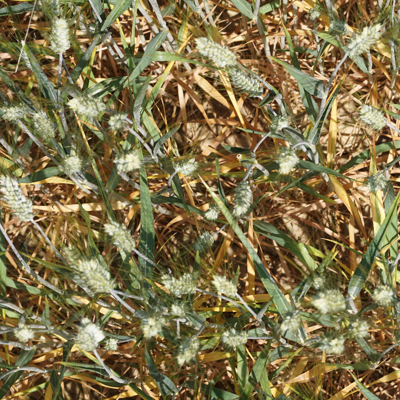

In [8]:
import PIL
from PIL import Image
#testing the result of data cleaning 
img = Image.open(trainData['path'][356])
img_resized = img.resize((400,400))
display(img_resized)

In [9]:
#Displaying images with bounding box
def bbox_img(df, ncol, nrow):
    fig, axes = plt.subplots(ncol, nrow, figsize = (12,12))
    for i in range(nrow*ncol):
        image_path = df['path'][i]
        image = Image.open(image_path)
        row = i // nrow
        col = i % ncol
        ax = axes[row, col]
        ax.imshow(image)
        ax.set_title(f'Image{i+1}')
        for box in df["BoxesString"][i]:
            xmin,ymin,xmax,ymax = box
            rect = patches.Rectangle((xmin,ymin), xmax - xmin, ymax - ymin, linewidth = 1 , edgecolor ='r', facecolor = 'none')
            ax.add_patch(rect)
    plt.tight_layout()
    plt.show()

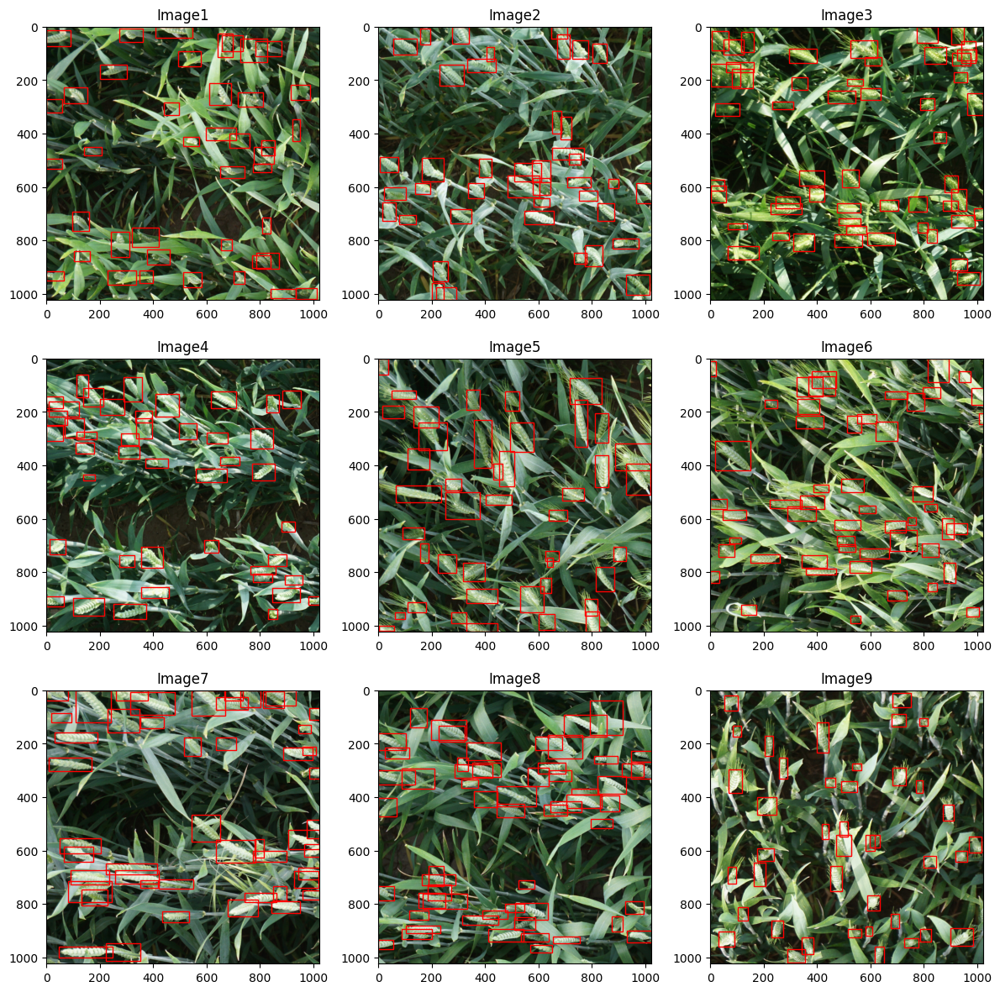

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches 
%matplotlib inline 

bbox_img(trainData, 3 ,3)

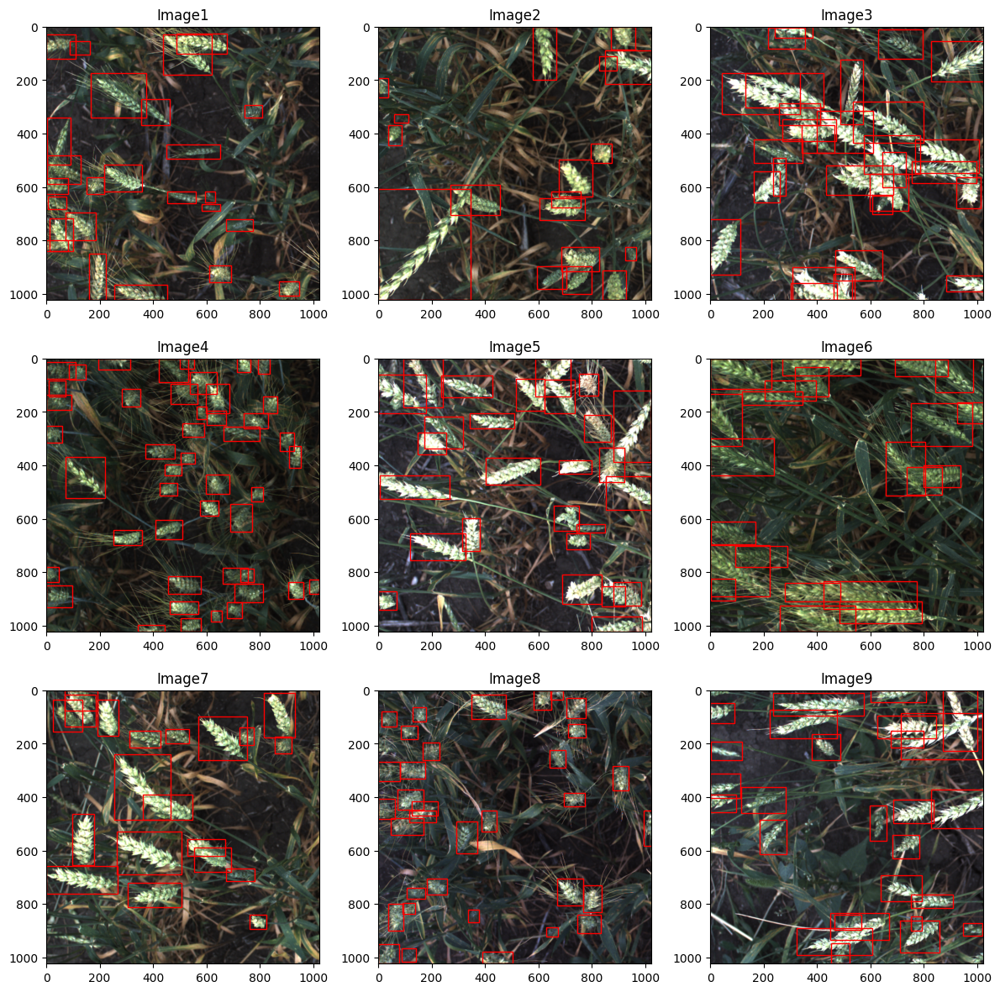

In [12]:
bbox_img(valData,3,3)

In [13]:
trainData['split'] = 'train'
valData['split'] = 'val'

In [14]:
data = pd.concat([trainData, valData]).reset_index(drop = True)
data.tail()

,image_name,BoxesString,path,split
5128,dbcb6136e997d3398ac2254ea0812413ff2aa4c437b89f...,"[[570, 966, 606, 1022], [0, 105, 18, 170], [99...",/kaggle/input/global-wheat-head-dataset-2021/g...,val
5129,1daa479f302fdc0f530b87a8db6312d267dbd3dee6035b...,"[[0, 193, 229, 274], [808, 449, 951, 540], [36...",/kaggle/input/global-wheat-head-dataset-2021/g...,val
5130,4f312cbe2aaa89b3951855c087693fba187814fb0bf613...,"[[519, 681, 735, 857]]",/kaggle/input/global-wheat-head-dataset-2021/g...,val
5131,2ed54d2c679fce26ab82bea2c9d89cf6fca9e18c4453ba...,"[[613, 290, 647, 322], [6, 754, 74, 813], [593...",/kaggle/input/global-wheat-head-dataset-2021/g...,val
5132,5eb0b0e743d8d76423adf28c95d0686bd29329fdbff38a...,"[[340, 302, 408, 347], [316, 270, 386, 307], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,val


In [15]:
#checking for duplicate items in the dataset
from collections import Counter

names_list = data['image_name'].tolist()
len(names_list)
count_dict = dict(Counter(names_list))

for key in count_dict.keys():
  if count_dict[key] != 1:
    print(key, count_dict[key])

d88963636d49127bda0597ef73f1703e92d6f111caefc44902d5932b8cd3fa94.png 2
1961bcf453d5b2206c428c1c14fe55d1f26f3c655db0a2b6a83094476e8edb5b.png 2


In [16]:
target = 'd88963636d49127bda0597ef73f1703e92d6f111caefc44902d5932b8cd3fa94.png'

for index, name in enumerate(names_list):
  if name == target:
    print(index)

1986
2070


In [17]:
#Displaying images with bounding box
def image_with_bbox(df, i_loc):
    fig, ax = plt.subplots(figsize = (5,5))
    image_path = df['path'][i_loc]
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(f'Image no {i_loc}')
    for box in df["BoxesString"][i_loc]:
        xmin,ymin,xmax,ymax = box
        rect = patches.Rectangle((xmin,ymin), xmax - xmin, ymax - ymin, linewidth = 2 , edgecolor ='r', facecolor = 'none')
        ax.add_patch(rect)
    plt.tight_layout()
    plt.show()

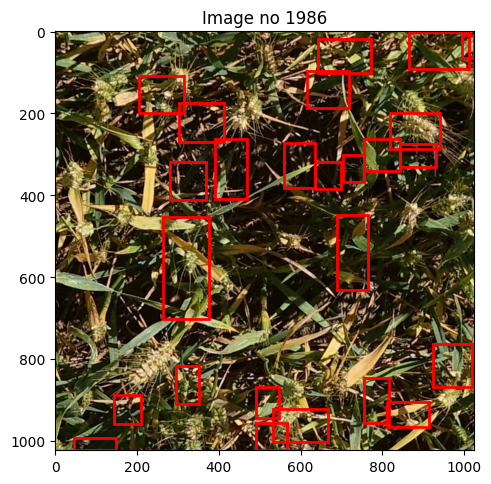

In [18]:
image_with_bbox(data, 1986)

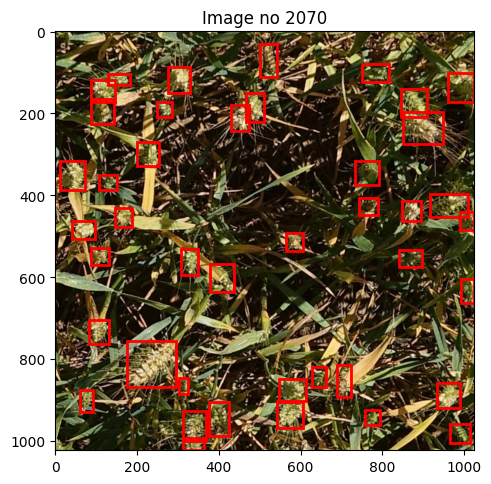

In [19]:
image_with_bbox(data, 2070)

In [20]:
target = '1961bcf453d5b2206c428c1c14fe55d1f26f3c655db0a2b6a83094476e8edb5b.png'

for index, name in enumerate(names_list):
  if name == target:
    print(index)

1999
2079


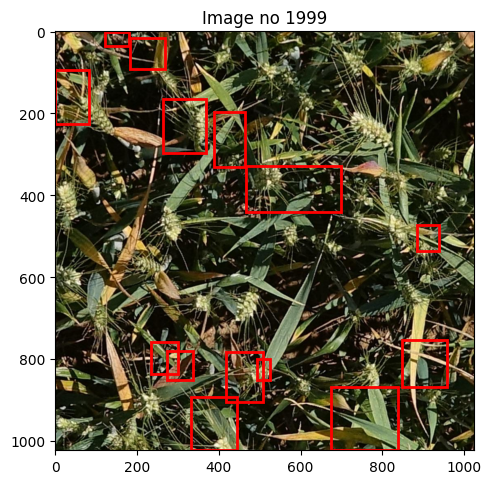

In [21]:
image_with_bbox(data, 1999)

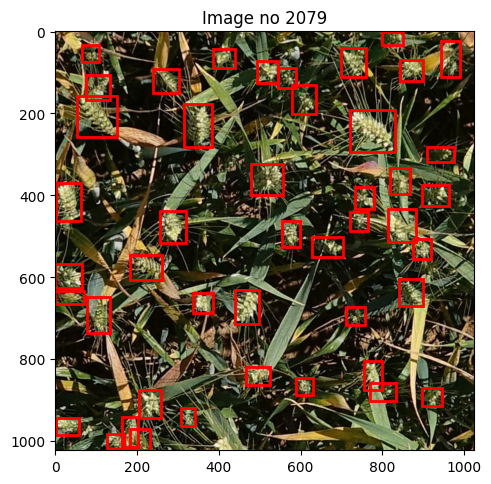

In [22]:
image_with_bbox(data, 2079)

In [23]:
clean_data = data.drop(data.index[[1986, 1999]])
clean_data.head()

,image_name,BoxesString,path,split
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,"[[99, 692, 160, 764], [641, 27, 697, 115], [93...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
1,a2a15938845d9812de03bd44799c4b1bf856a8ad11752e...,"[[230, 143, 321, 222], [928, 929, 1015, 1004],...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
2,401f89a2bb6ab63e3f406bd59b9cadccfe953230feb6cd...,"[[440, 239, 544, 288], [333, 538, 429, 594], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
3,0a3937653483c36dfb4d957b6f82ae96dbdc7ba36cc3d8...,"[[112, 274, 188, 303], [892, 812, 958, 847], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
4,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,"[[810, 204, 863, 314], [360, 231, 425, 408], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train


In [24]:
print(clean_data["path"][0])

/kaggle/input/global-wheat-head-dataset-2021/gwhd_2021/images/4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e36f7c6aaf097c7ce423.png


In [25]:
clean_data = clean_data.reset_index(drop=True)
clean_data.to_csv("/kaggle/working/clean_data.csv")

In [26]:
if clean_data.index.equals(pd.RangeIndex(start=0, stop=len(clean_data), step=1)):
    print("Index has been resetted.")
else:
    print("Index has not been resetted.")


Index has been resetted.


In [27]:
print(clean_data["image_name"][0])

4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e36f7c6aaf097c7ce423.png


In [28]:
import re
# Define a regex pattern to match the file extension
pattern = r'\.png$'
# Use re.sub() to replace the file extension with an empty string for all elements in the column
clean_data['image_name'] = clean_data['image_name'].apply(lambda x: re.sub(pattern, '', x))

print(clean_data["image_name"][0])

4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e36f7c6aaf097c7ce423


In [29]:
# Display the DataFrame with the filenames without extension
clean_data.head()

,image_name,BoxesString,path,split
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,"[[99, 692, 160, 764], [641, 27, 697, 115], [93...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
1,a2a15938845d9812de03bd44799c4b1bf856a8ad11752e...,"[[230, 143, 321, 222], [928, 929, 1015, 1004],...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
2,401f89a2bb6ab63e3f406bd59b9cadccfe953230feb6cd...,"[[440, 239, 544, 288], [333, 538, 429, 594], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
3,0a3937653483c36dfb4d957b6f82ae96dbdc7ba36cc3d8...,"[[112, 274, 188, 303], [892, 812, 958, 847], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train
4,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,"[[810, 204, 863, 314], [360, 231, 425, 408], [...",/kaggle/input/global-wheat-head-dataset-2021/g...,train


In [30]:
os.makedirs('./cleanDataset/images/train', exist_ok = True)
os.makedirs('./cleanDataset/images/val', exist_ok = True)

path2 = '/kaggle/working/cleanDataset/images/'
import shutil
for i in range(len(clean_data)):
    row = clean_data.loc[i]
    if os.path.exists(f"{path2}/{row.split}/{row.image_name}.png"):
        pass
    else:
        shutil.copyfile(row.path, f"{path2}/{row.split}/{row.image_name}.png")

In [31]:
def createYOLOBox(bbox):
    img_width = 1024
    img_height = 1024
    
    # Unpacking coordinates from list
    xmin, ymin, xmax, ymax = bbox
    
    width = xmax - xmin
    height = ymax - ymin

    # Calculate bounding box center coordinates
    x_center = ((xmax + xmin)/(2*img_width))
    y_center = ((ymax + ymin)/(2*img_height))
    
    # Normalize width and height
    width /= img_width
    height /= img_height
    
    return f'0 {x_center} {y_center} {width} {height}'

In [32]:
for i in range(len(clean_data)):
    if clean_data["BoxesString"][i] == "no_box":
        print("No Box found at index:", i)
    else:
        pass
print("All images have bounding boxes")

All images have bounding boxes


In [33]:
os.makedirs('./cleanDataset/labels/train', exist_ok = True)
os.makedirs('./cleanDataset/labels/val', exist_ok = True)

for i in range(len(clean_data)):
    row = clean_data.loc[i]
    for d in row["BoxesString"]:
        yoloBox = createYOLOBox(d)
        filepath = f'/kaggle/working/cleanDataset/labels/{row["split"]}/{row["image_name"]}.txt'
        with open(filepath, 'a') as file:
            file.write(yoloBox + '\n')
                

In [34]:
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5643.4/8062.4 GB disk)


In [35]:
#creating the yaml file required for YOLO
content = '''
path: /kaggle/working/cleanDataset
train: images/train
val: images/val

nc: 1
names: ['wheat']
'''
with open('WheatHeadDetection.yaml', 'w') as file:
    file.write(content)

In [36]:
# Loading pre-trained YOLOv8n model
model = YOLO('yolov8n.pt')
model.info()

100%|██████████| 6.23M/6.23M [00:00<00:00, 136MB/s]


YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

In [38]:
# Training the model
results = model.train(
    data = 'WheatHeadDetection.yaml',
    epochs = 100,
    batch = 32,
    imgsz = 1024,
    optimizer = 'Adam',
    cos_lr = True,
    dropout = 0.2,
    device = [0, 1]
)

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=WheatHeadDetection.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=1024, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fal

100%|██████████| 755k/755k [00:00<00:00, 23.3MB/s]
2024-06-03 18:15:19,883	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-03 18:15:20,684	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/cleanDataset/labels/train... 3605 images, 50 backgrounds, 0 corrupt: 100%|██████████| 3655/3655 [00:40<00:00, 89.92it/s] 


train: WARNING ⚠️ /kaggle/working/cleanDataset/images/train/502d5e4a8b89aeffaa6adf13e1215d27c2951230ab06a4fcb93732117196f124.png: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/cleanDataset/images/train/8b461a21b9b01c657d41dfdf35b3607a0ab920c2cb78184c6e523391f5f3d554.png: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/cleanDataset/images/train/9f697765bd41325baaf635d5389020270c4536200f97884928c014ac1d39ce12.png: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/cleanDataset/images/train/c1db9589b954aa1ef2b5bf065d09aba926e674679a553c6dd6bfd5d6ae81f86a.png: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/cleanDataset/images/train/ed17cba877ba4983b072ead24480913fb4cff9f1fc0f920e07021ca4f4f2ace2.png: 1 duplicate labels removed
train: New cache created: /kaggle/working/cleanDataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), ti

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/cleanDataset/labels/val... 1448 images, 28 backgrounds, 0 corrupt: 100%|██████████| 1476/1476 [00:17<00:00, 83.01it/s]


val: New cache created: /kaggle/working/cleanDataset/labels/val.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100        13G      1.756      1.351      1.439        309       1024: 100%|██████████| 115/115 [02:07<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:38<00:00,  1.23it/s]


                   all       1476      44347      0.399       0.18      0.187     0.0676

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      13.8G       1.69      1.053      1.393        345       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.27it/s]


                   all       1476      44347      0.795      0.658      0.733      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      12.6G      1.661      1.002      1.393        215       1024: 100%|██████████| 115/115 [01:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.741      0.602      0.677        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.9G      1.637     0.9779      1.382        288       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.706      0.629        0.7      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      9.56G       1.62     0.9492      1.377        251       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.783      0.642       0.73      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      13.1G      1.614     0.9304      1.373        304       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.837      0.727      0.818      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100        13G      1.616     0.9306      1.379        140       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.851      0.753       0.84      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      11.4G      1.594      0.907      1.366        236       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:38<00:00,  1.21it/s]


                   all       1476      44347      0.681      0.638      0.676      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       9.6G      1.586     0.8966      1.367        211       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.776      0.692      0.754      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.4G       1.57     0.8844       1.36        269       1024: 100%|██████████| 115/115 [01:52<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:38<00:00,  1.22it/s]


                   all       1476      44347      0.848      0.729      0.819       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      13.2G      1.577      0.875      1.359        290       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.832      0.641      0.744      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      11.6G      1.566     0.8682      1.361        243       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.854      0.769      0.845      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      13.4G      1.584     0.8763      1.371        190       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.861      0.765      0.848      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      12.2G      1.551     0.8555      1.357        217       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.801      0.645      0.729      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      9.65G      1.568     0.8696      1.366        325       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.853      0.745      0.832      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.37G      1.569     0.8579      1.359        230       1024: 100%|██████████| 115/115 [01:53<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347       0.79      0.694      0.768      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      9.99G      1.565     0.8583      1.361        330       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.33it/s]


                   all       1476      44347       0.87      0.748      0.842      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       9.6G      1.544     0.8374      1.348        241       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.874      0.796      0.875      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.5G      1.551      0.848      1.367        240       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.861      0.734      0.828      0.451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      13.4G      1.541     0.8442      1.351        405       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.31it/s]


                   all       1476      44347      0.864      0.746      0.841      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.7G      1.548     0.8364      1.356        225       1024: 100%|██████████| 115/115 [01:42<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.868      0.763      0.851      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      13.4G       1.54     0.8351      1.352        312       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.868      0.717      0.828      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.38G      1.546     0.8424      1.352        427       1024: 100%|██████████| 115/115 [01:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.875       0.78      0.868      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100        11G      1.534      0.828      1.349        208       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.883      0.787       0.87      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      13.4G      1.558     0.8413      1.369        182       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.861       0.77      0.849      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      12.4G      1.542     0.8411      1.356        239       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.893      0.781      0.874      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.98G      1.526     0.8203      1.351        274       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.886      0.805      0.881      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.6G      1.527     0.8203      1.341        308       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.885      0.801      0.879      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      11.7G      1.544     0.8316      1.363        161       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.25it/s]


                   all       1476      44347      0.898      0.783      0.872      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100        12G      1.529     0.8227      1.345        199       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347       0.89       0.76      0.857      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      12.6G      1.537     0.8263      1.353        253       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.32it/s]


                   all       1476      44347      0.884      0.726      0.828      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      9.27G      1.513     0.8125      1.341        187       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.897      0.804      0.883      0.469

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       8.7G       1.53     0.8175      1.343        278       1024: 100%|██████████| 115/115 [01:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.847      0.712      0.796      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.4G      1.516     0.8085      1.339        264       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.32it/s]


                   all       1476      44347      0.886       0.77      0.864      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.1G      1.525     0.8042      1.344        279       1024: 100%|██████████| 115/115 [01:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.32it/s]


                   all       1476      44347      0.899      0.805      0.886      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      13.1G      1.528      0.808      1.343        219       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.906      0.786      0.876      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      11.1G      1.509     0.7969      1.333        236       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.895      0.784      0.867      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      13.3G      1.523     0.8013      1.347        123       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.897      0.811      0.894      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      9.17G      1.498     0.7905      1.329        204       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.894      0.788      0.868      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      11.5G      1.503     0.7908      1.335        209       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.894      0.808      0.892      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      9.67G      1.509     0.7919       1.34        247       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.863      0.759       0.85      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.7G      1.505     0.7903      1.335        374       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347       0.89      0.783       0.87      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.45G        1.5     0.7869      1.337        246       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.909      0.794      0.885      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      9.91G       1.51     0.7861      1.345        387       1024: 100%|██████████| 115/115 [01:53<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.891      0.816      0.894       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      9.94G      1.497     0.7759      1.329        334       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.905      0.801      0.889      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.3G      1.496     0.7741      1.333        245       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.907      0.777       0.87      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      11.4G      1.493      0.777      1.331        359       1024: 100%|██████████| 115/115 [01:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.904      0.796      0.885      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      11.3G      1.493     0.7796      1.333        324       1024: 100%|██████████| 115/115 [01:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.911      0.811      0.896      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      9.24G      1.483     0.7675      1.321        352       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.32it/s]


                   all       1476      44347      0.897      0.789      0.878      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      9.17G       1.49     0.7715      1.327        228       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.33it/s]


                   all       1476      44347      0.903      0.823      0.898      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      11.1G      1.481     0.7683      1.321        358       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.902       0.82      0.898      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.3G      1.489     0.7697      1.323        260       1024: 100%|██████████| 115/115 [01:53<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.914      0.823      0.903      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.2G      1.489     0.7673      1.329        345       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.893      0.837      0.906      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      11.2G      1.496     0.7705      1.327        130       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:38<00:00,  1.22it/s]


                   all       1476      44347      0.899      0.838      0.907      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      13.1G      1.472     0.7558      1.316        137       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347        0.9      0.825        0.9      0.468


  0%|          | 0/115 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.37G      1.486     0.7646      1.324        155       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.915      0.833      0.909      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.99G      1.478     0.7603       1.32        229       1024: 100%|██████████| 115/115 [01:54<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.901      0.836      0.905      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      11.7G      1.461     0.7543      1.312        305       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.908      0.834      0.908      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      9.12G      1.483     0.7598      1.326        249       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.905      0.838      0.911      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      11.7G      1.487     0.7593      1.326        195       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:38<00:00,  1.23it/s]


                   all       1476      44347      0.905      0.843      0.913      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.3G      1.476     0.7487      1.314        228       1024: 100%|██████████| 115/115 [01:53<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.917      0.835      0.913      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100        12G      1.464     0.7458      1.308        257       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.905       0.84      0.908      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      9.32G      1.468     0.7414      1.311        204       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.897      0.828      0.899      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100        12G      1.472     0.7393      1.313        358       1024: 100%|██████████| 115/115 [01:51<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.912      0.829      0.904      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100        12G      1.453     0.7347      1.313        211       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.918      0.817      0.901      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.4G      1.454     0.7333      1.313        330       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.904      0.836      0.908      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      12.3G      1.459     0.7358      1.308        383       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.912      0.834      0.908       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      9.57G      1.449     0.7229      1.304        154       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.907      0.841      0.912      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.3G      1.458      0.729       1.31        310       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.918      0.835       0.91      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.4G      1.448     0.7245      1.306        182       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.33it/s]


                   all       1476      44347      0.919      0.835      0.913      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.6G      1.426     0.7128      1.296        327       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.913      0.827      0.905      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      14.7G      1.435     0.7112      1.296        300       1024: 100%|██████████| 115/115 [01:52<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.905      0.848      0.915      0.471

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      12.5G      1.443     0.7166      1.297        150       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.899      0.849      0.913      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.1G      1.447     0.7172      1.302        196       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.916      0.842      0.914      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      13.3G      1.429     0.7084      1.293        270       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.921       0.84      0.916      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      12.8G       1.45     0.7222      1.306        239       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.911      0.848      0.918      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      9.77G      1.423     0.7067      1.277        470       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.31it/s]


                   all       1476      44347      0.913      0.851       0.92        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      11.6G      1.415     0.6984      1.286        263       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:35<00:00,  1.33it/s]


                   all       1476      44347      0.915      0.846      0.918      0.496

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      9.48G      1.425     0.7051      1.293        171       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347       0.91      0.843      0.913      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.7G      1.423     0.7009      1.283        208       1024: 100%|██████████| 115/115 [01:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.911      0.854       0.92      0.486

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      12.3G      1.423      0.695       1.29        313       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.906       0.85      0.915      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       9.3G       1.43     0.6982       1.29        270       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347       0.91      0.851      0.917      0.478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      11.7G      1.426      0.693      1.288        143       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.913      0.855      0.921      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      12.7G      1.414     0.6903       1.29        237       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.27it/s]


                   all       1476      44347      0.915      0.849      0.917      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.2G      1.414     0.6869      1.287        239       1024: 100%|██████████| 115/115 [01:43<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.27it/s]


                   all       1476      44347      0.914      0.853       0.92      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.43G      1.413     0.6875      1.279        219       1024: 100%|██████████| 115/115 [01:48<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.913      0.854       0.92      0.482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      14.3G      1.412     0.6876      1.285        238       1024: 100%|██████████| 115/115 [01:47<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.905      0.853      0.916       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.8G        1.4     0.6757      1.277        109       1024: 100%|██████████| 115/115 [01:49<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.908      0.851      0.916      0.469

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      9.15G      1.394     0.6732      1.267        313       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.912      0.853      0.919      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.7G      1.408     0.6807      1.276        186       1024: 100%|██████████| 115/115 [01:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.912      0.854      0.919       0.48
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.59G      1.416     0.6759      1.313        121       1024: 100%|██████████| 115/115 [01:50<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.27it/s]


                   all       1476      44347       0.91      0.844      0.915      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.62G        1.4     0.6652      1.304        117       1024: 100%|██████████| 115/115 [01:38<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.27it/s]


                   all       1476      44347      0.909      0.852      0.918      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      9.68G      1.409     0.6688      1.301        228       1024: 100%|██████████| 115/115 [01:44<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.914      0.854      0.921      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.97G      1.388     0.6587      1.297        188       1024: 100%|██████████| 115/115 [01:41<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.909      0.852      0.916       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.71G      1.388     0.6565       1.29        168       1024: 100%|██████████| 115/115 [01:45<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.911      0.851      0.916      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.21G       1.39     0.6567      1.291        186       1024: 100%|██████████| 115/115 [01:41<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.30it/s]


                   all       1476      44347      0.911      0.851      0.917      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.16G      1.394     0.6495      1.301        110       1024: 100%|██████████| 115/115 [01:39<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:37<00:00,  1.26it/s]


                   all       1476      44347      0.911       0.85      0.916      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       6.7G       1.39     0.6511      1.296        142       1024: 100%|██████████| 115/115 [01:38<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.913      0.851      0.918      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.17G      1.388     0.6512      1.293        213       1024: 100%|██████████| 115/115 [01:40<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.29it/s]


                   all       1476      44347      0.913       0.85      0.917      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.82G      1.387     0.6532      1.296        162       1024: 100%|██████████| 115/115 [01:38<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:36<00:00,  1.28it/s]


                   all       1476      44347      0.915       0.85      0.918      0.479

100 epochs completed in 4.049 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:48<00:00,  1.04s/it]


                   all       1476      44347      0.921       0.84      0.916      0.515
Speed: 0.5ms preprocess, 5.3ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train2


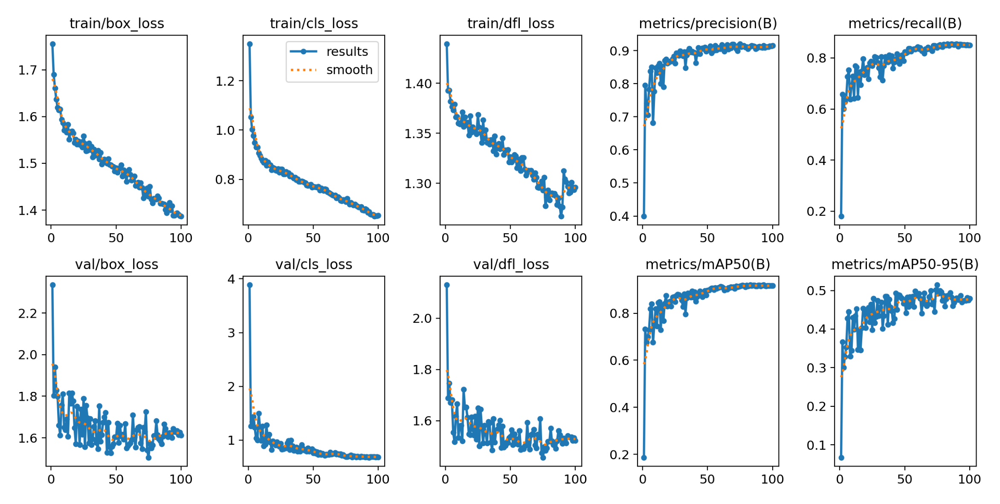

In [44]:
img = Image.open('/kaggle/working/runs/detect/train2/results.png')

# Displaying the image
plt.figure(figsize = (30, 30))
plt.imshow(img)
plt.axis('off')
plt.show()

In [47]:
# Load a model
model = YOLO("./runs/detect/train2/weights/best.pt")  # pretrained YOLOv8n model

# Run batched inference on a list of images
results = model(["/kaggle/input/global-wheat-head-dataset-2021/gwhd_2021/images/255b6ca9fea63f44125e5174bc932470b604c76043071522ba0ef63abb1a544b.png"], stream=True)  # return a generator of Results objects

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
#     masks = result.masks  # Masks object for segmentation masks outputs
#     keypoints = result.keypoints  # Keypoints object for pose outputs
#     probs = result.probs  # Probs object for classification outputs
#     obb = result.obb  # Oriented boxes object for OBB outputs
#     result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk


0: 1024x1024 46 wheats, 13.5ms
Speed: 8.0ms preprocess, 13.5ms inference, 638.1ms postprocess per image at shape (1, 3, 1024, 1024)


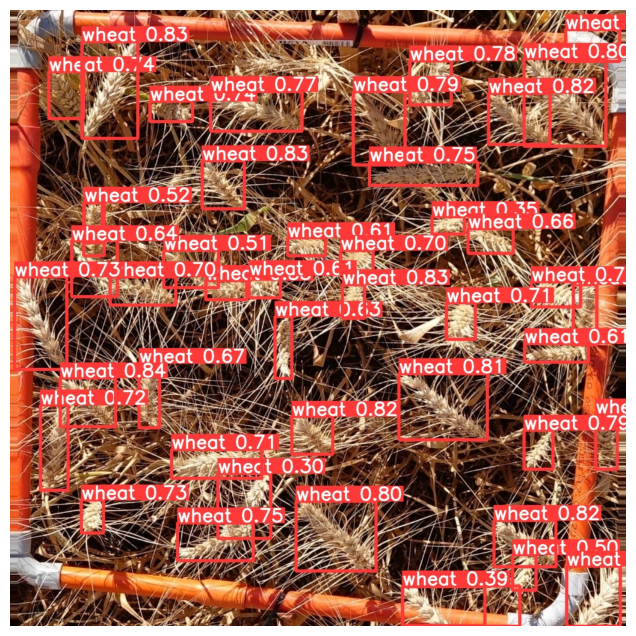

In [49]:
img = Image.open('result.jpg')

# Displaying the image
plt.figure(figsize = (8, 8))
plt.imshow(img)
plt.axis('off')
plt.show()